### R SITS Model

In [1]:
#install.packages('tidyverse', lib='~/R/x86_64-pc-linux-gnu-library/4.2')
#install.packages('sits', lib='~/R/x86_64-pc-linux-gnu-library/4.2')
#install.packages('devtools', lib='~/R/x86_64-pc-linux-gnu-library/4.2')


In [2]:
library(tidyverse, lib='~/R/x86_64-pc-linux-gnu-library/4.2')
library(sits, lib='~/R/x86_64-pc-linux-gnu-library/4.2')

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.2     ✔ readr     2.1.4
✔ forcats   1.0.0     ✔ stringr   1.5.0
✔ ggplot2   3.4.2     ✔ tibble    3.2.1
✔ lubridate 1.9.2     ✔ tidyr     1.3.0
✔ purrr     1.0.1     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors
SITS - satellite image time series analysis.

Loaded sits v1.4.1.
        See ?sits for help, citation("sits") for use in publication.
        Documentation avaliable in https://e-sensing.github.io/sitsbook/.



  |======================================================================| 100%


The legacy packages maptools, rgdal, and rgeos, underpinning this package
will retire shortly. Please refer to R-spatial evolution reports on
https://r-spatial.org/r/2023/05/15/evolution4.html for details.
This package is now running under evolution status 0 



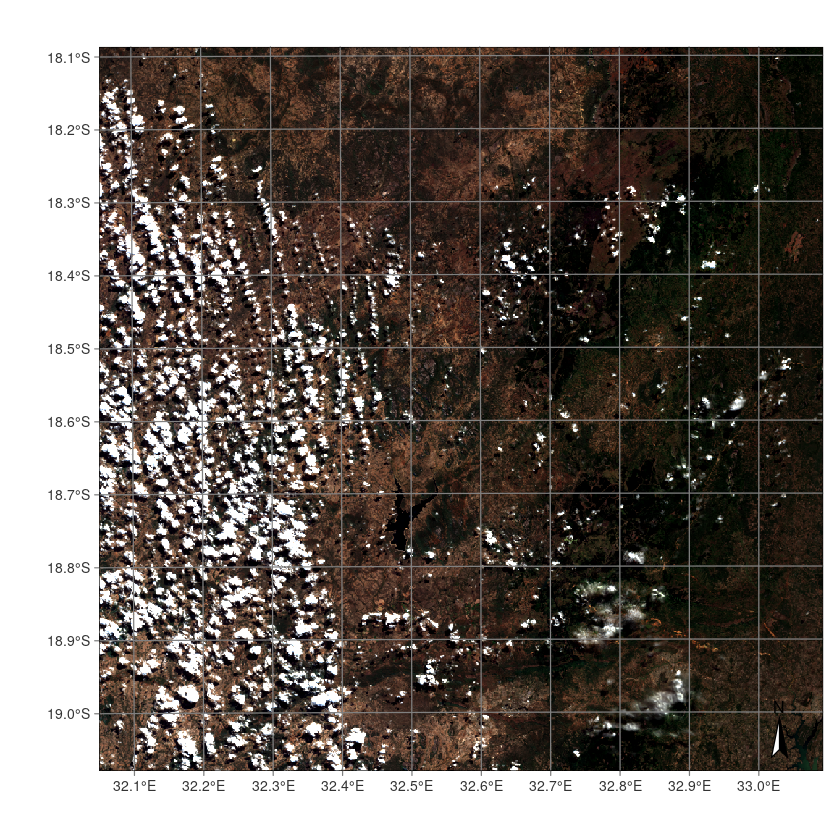

In [6]:
dea_cube <- sits_cube(
  source = "DEAFRICA",
  collection = "S2_L2A",
  roi = c(
    lon_min = 32.87, lat_min = -18.38,
    lon_max = 32.98, lat_max = -18.25
  ),
  bands = c("B01", "B02", "B03", "B04", "B05", "B06", "B07", "B08", "B8A", "B09", "B11", "B12"),
  start_date = "2019-06-01",
  end_date = "2019-09-01"
)
plot(dea_cube, red = "B04", blue = "B02", green = "B03")

In [7]:
reg_cube <- sits_regularize(
  cube       = dea_cube,
  output_dir = '~/R',
  res        = 60,
  period     = "P15D",
  multicores = 4
)

Warning message:
“Cloud band not found in provided cube.
                    'sits_regularize()' will just fill nodata values.”


  |======================================================================| 100%


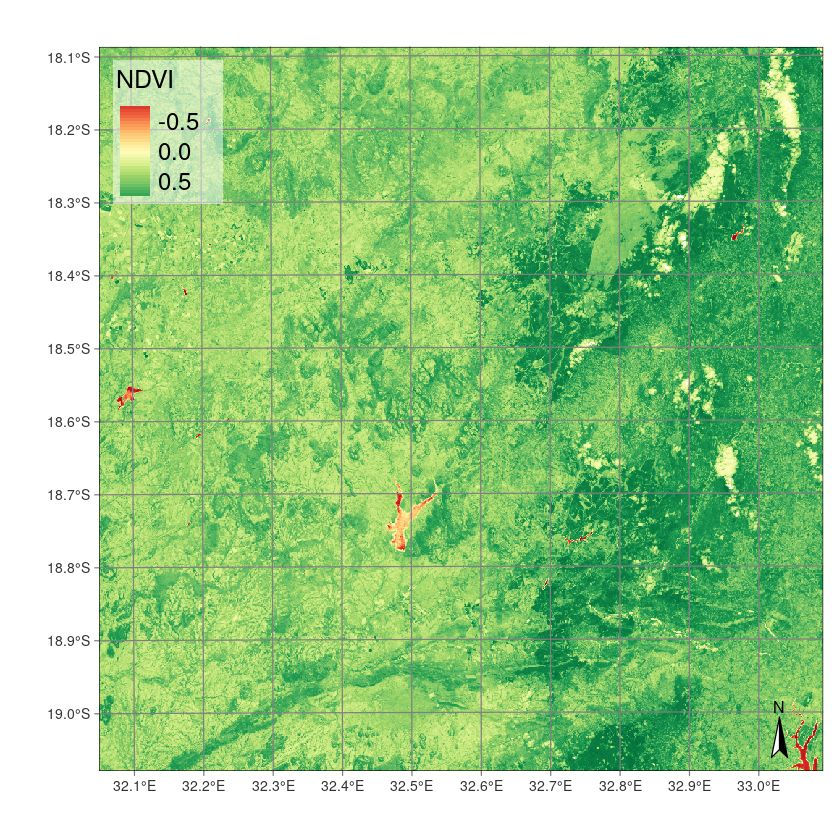

In [8]:
reg_cube <- sits_apply(reg_cube,
  NDVI = (B08 - B04) / (B08 + B04),
  output_dir = '~/R',
  multicores = 4,
  memsize = 12
)
plot(reg_cube, band = "NDVI", color_palette = "RdYlGn")

  |======================================================================| 100%


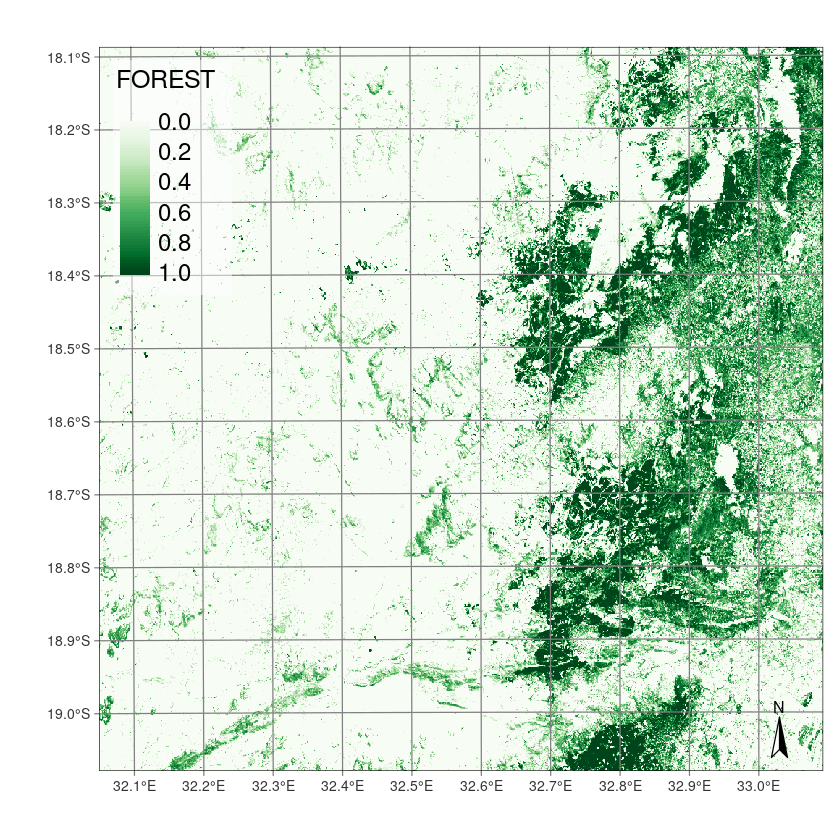

In [9]:
em <- tibble::tribble(
  ~class,   ~B02, ~B03, ~B04, ~B8A, ~B11, ~B12,
  "forest",  200,  352,  189, 2800, 1340,  546,
  "soil",    400,  650,  700, 3600, 3500, 1800,
  "water",   700, 1100, 1400,  850,   40,   26
)
# Generate the mixture model
reg_cube <- sits_mixture_model(
  data = reg_cube,
  endmembers = em,
  multicores = 4,
  memsize = 12,
  output_dir = '~/R'
)
# Plot the FOREST for the first date using the Greens palette
plot(reg_cube, band = "FOREST", color_palette = "Greens")

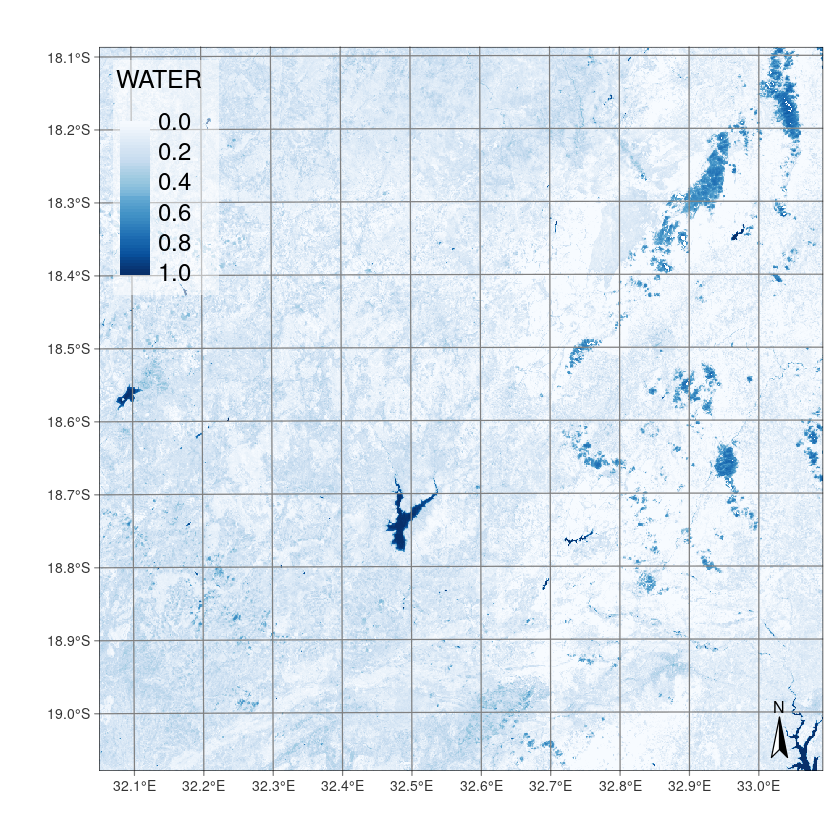

In [10]:
plot(reg_cube, band = "WATER", color_palette = "Blues")

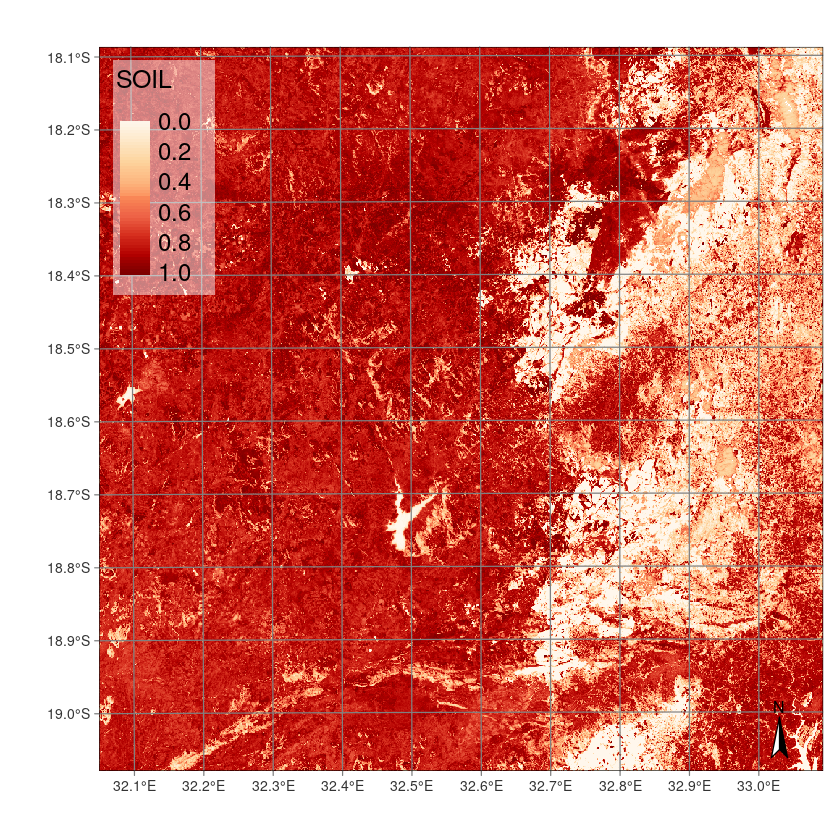

In [11]:
plot(reg_cube, band = "SOIL", color_palette = "OrRd")

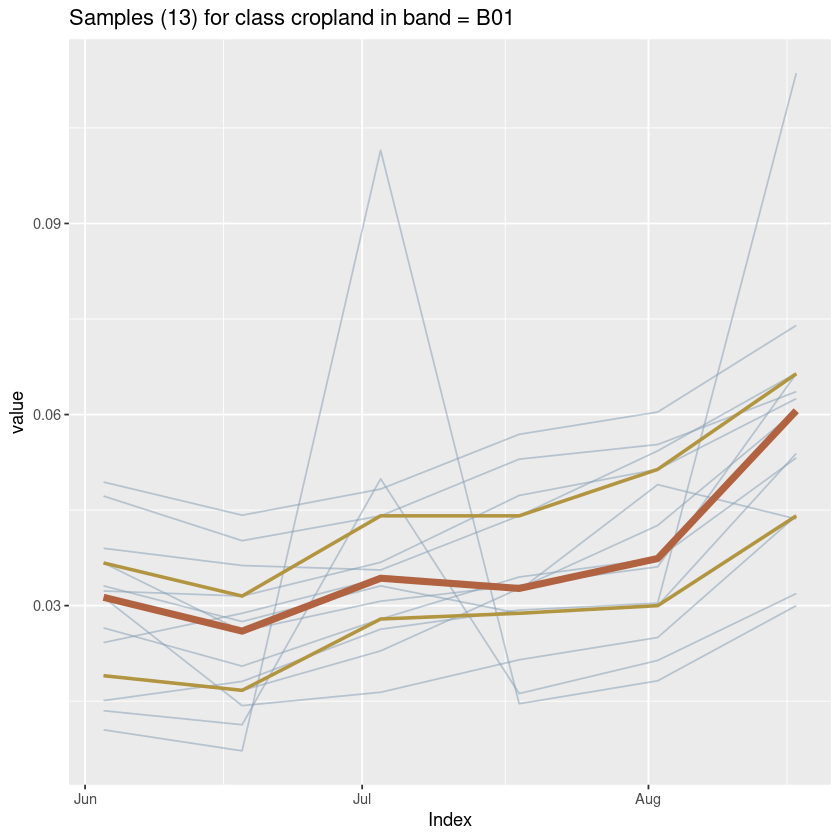

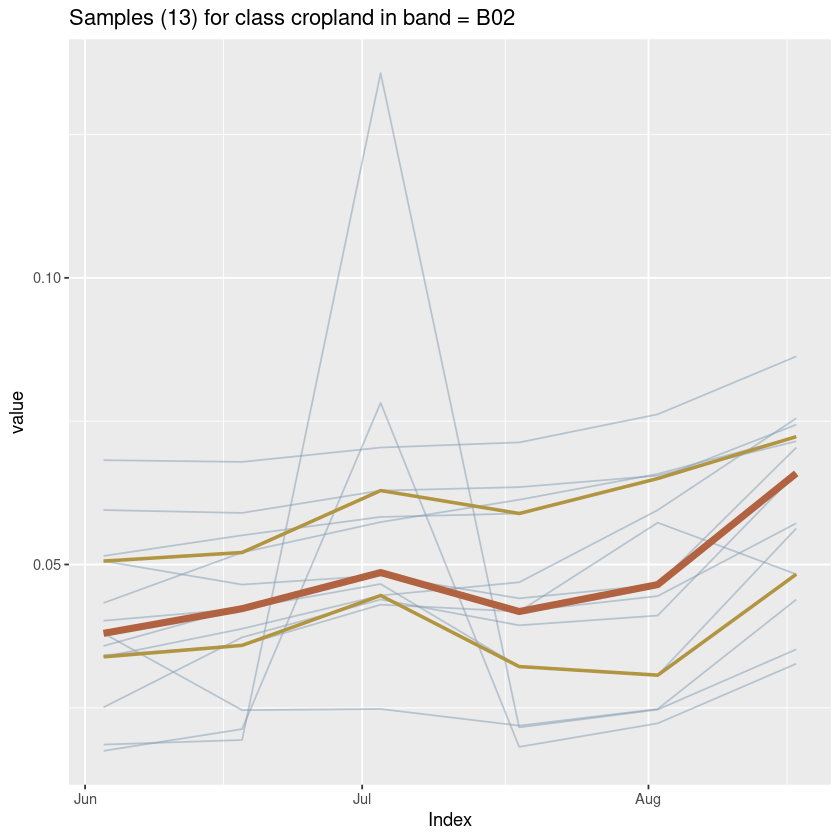

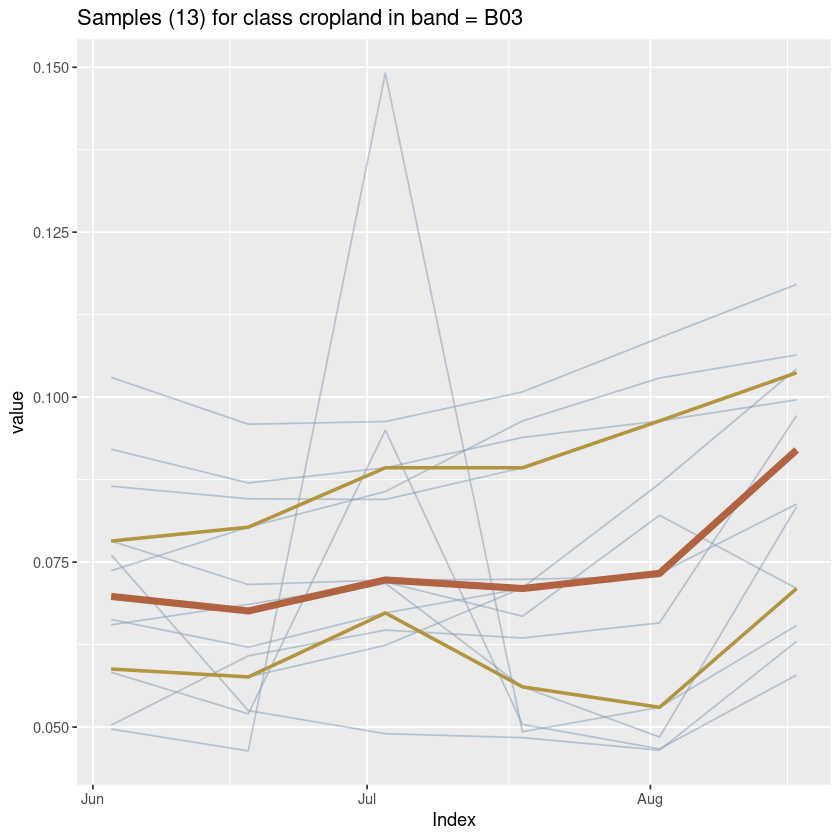

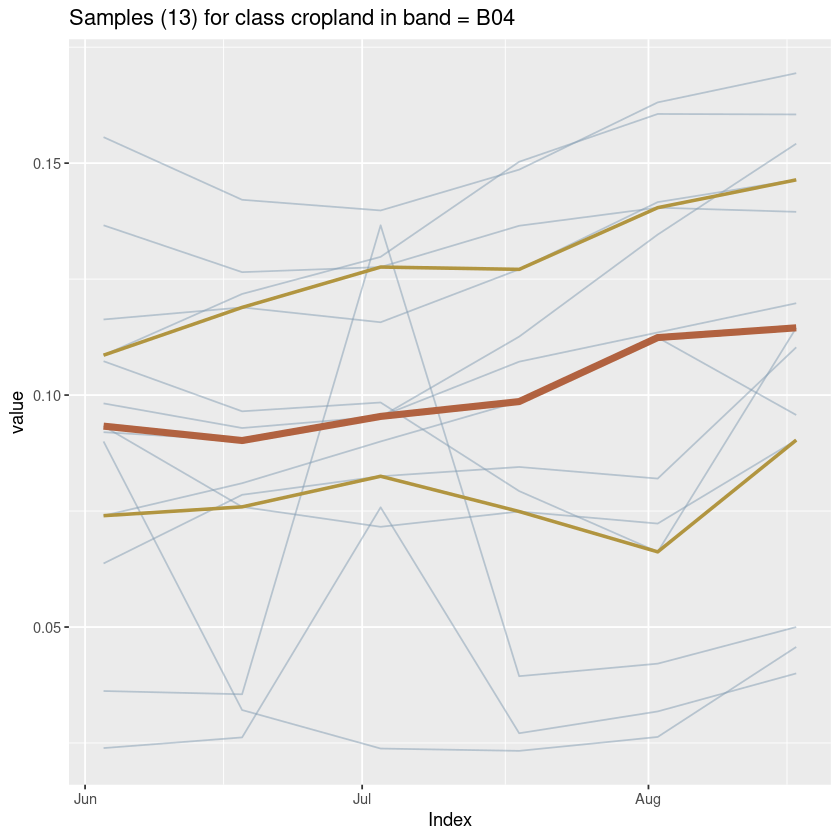

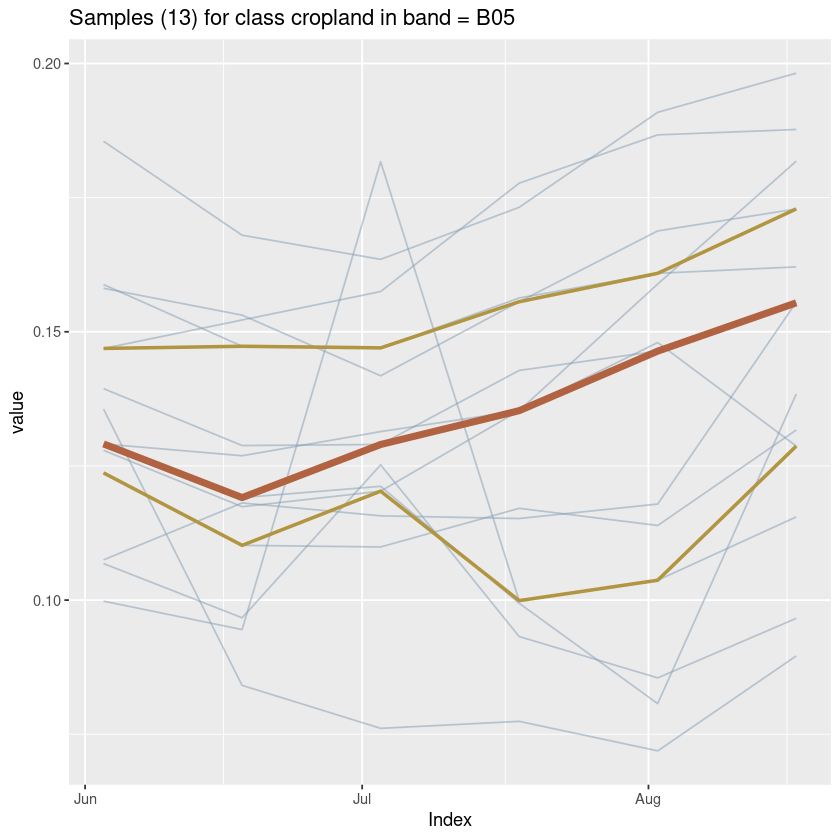

...

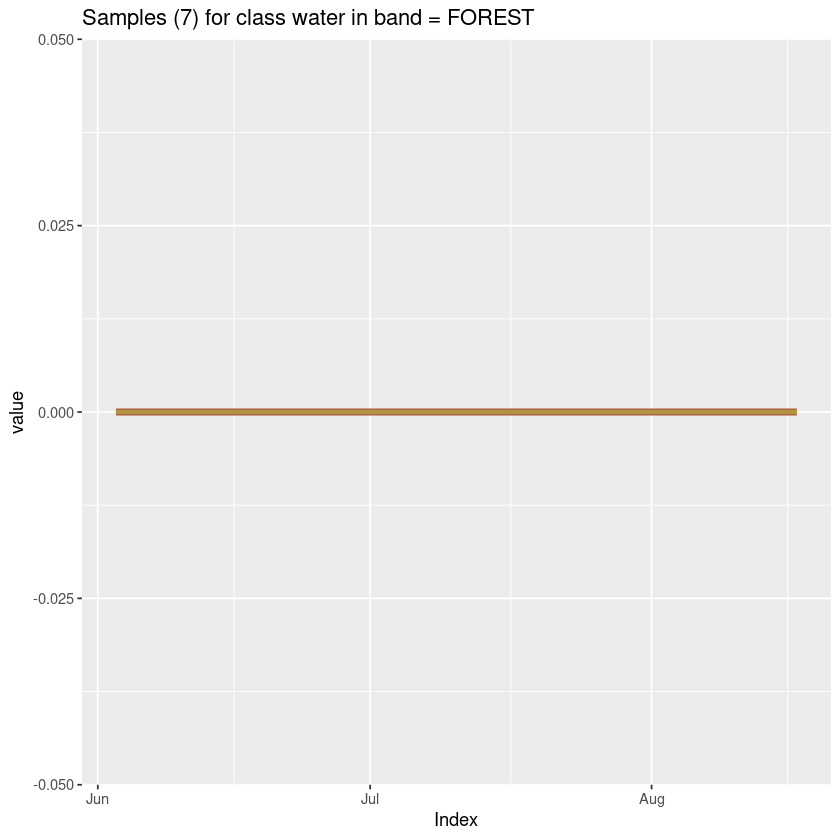

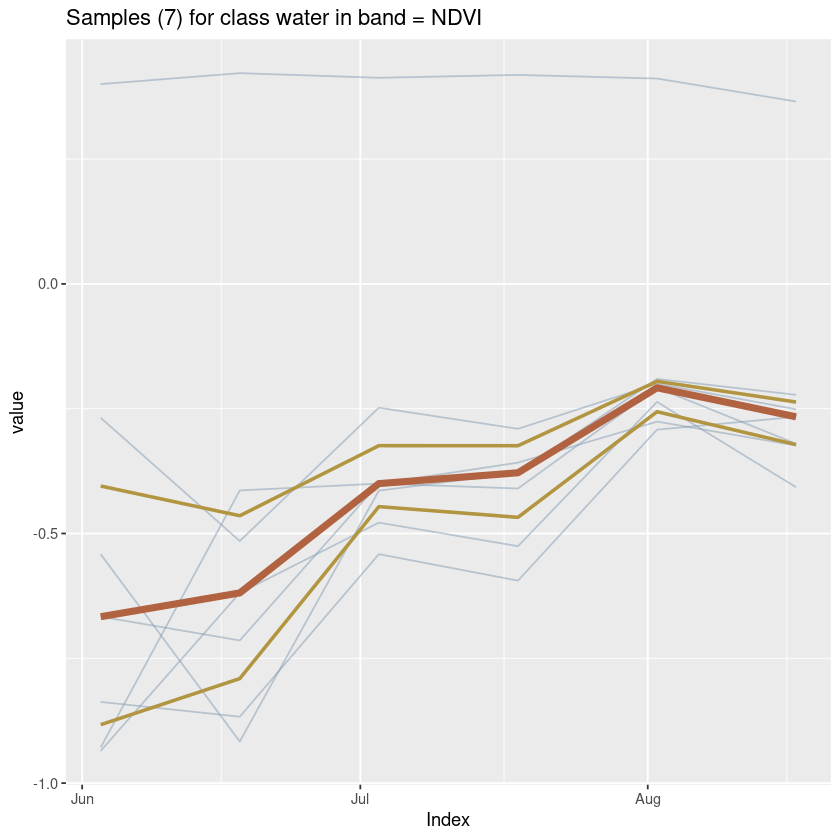

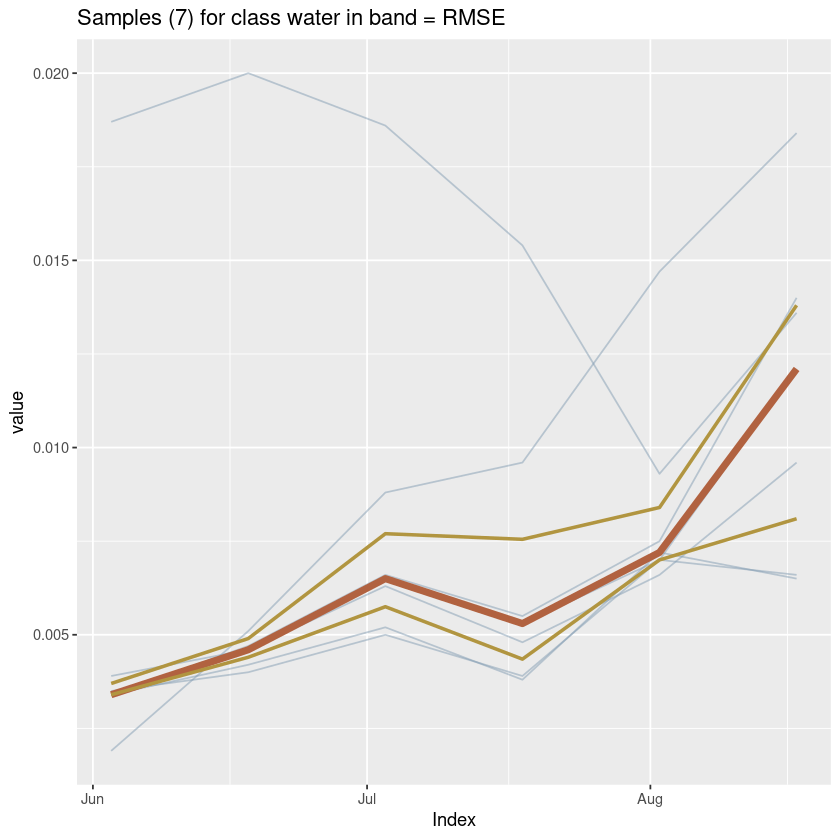

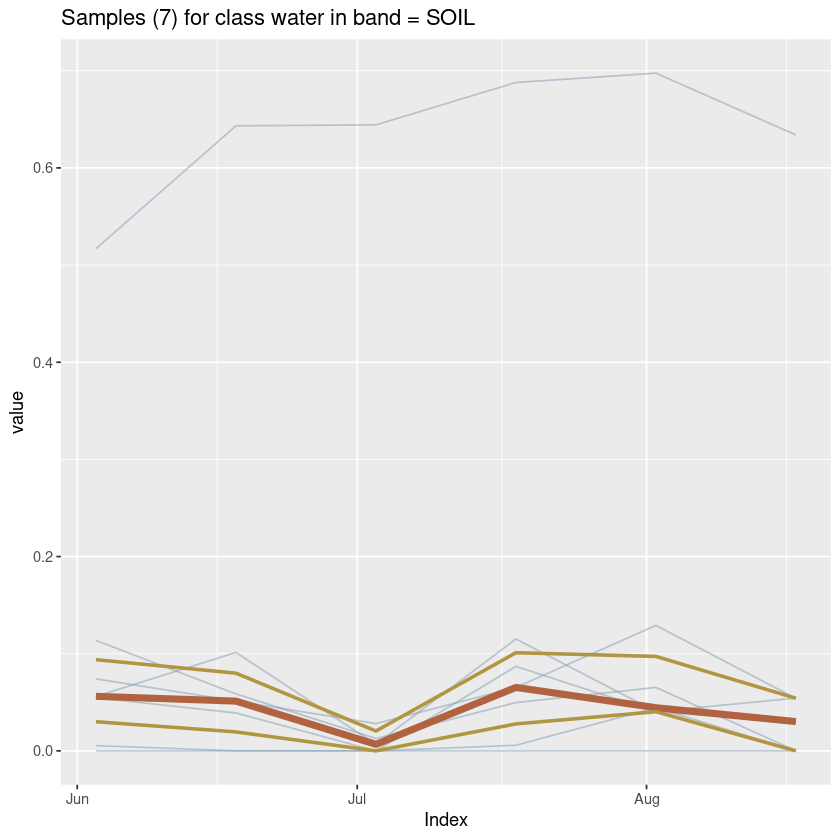

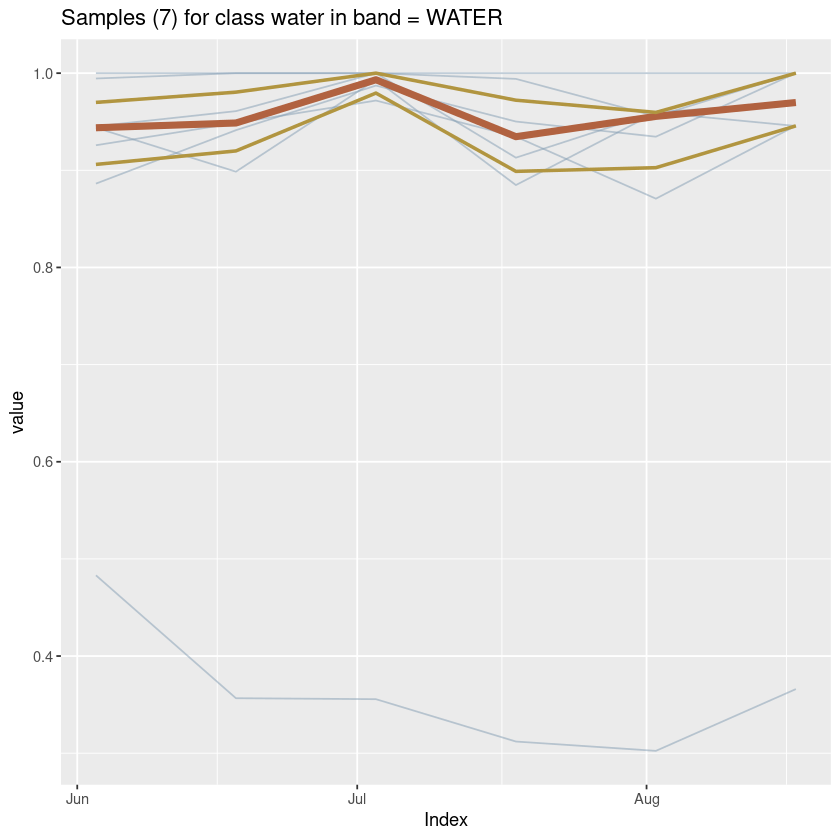

In [13]:
series <- sits_get_data(
    cube=reg_cube,
    samples='data/Rsits_Zim.csv')

plot(series[1])

In [16]:
series[1:10,]

longitude,latitude,start_date,end_date,label,cube,time_series
<dbl>,<dbl>,<date>,<date>,<chr>,<chr>,<list>
32.08100,-18.57010,2019-06-03,2019-08-17,water,S2_L2A,"18050.0000, 18065.0000, 18080.0000, 18095.0000, 18110.0000, 18125.0000, 0.0042, 0.0025, 0.0083, 0.0083, 0.0245, 0.0197, 0.0065, 0.0095, 0.0143, 0.0089, 0.0226, 0.0185, 0.0097, 0.0098, 0.0137, 0.0105, 0.0220, 0.0181, 0.0030, 0.0034, 0.0068, 0.0045, 0.0136, 0.0095, 0.0029, 0.0026, 0.0056, 0.0043, 0.0131, 0.0091, 0.0009, 0.0011, 0.0036, 0.0022, 0.0106, 0.0059, 0.0007, 0.0023, 0.0044, 0.0017, 0.0101, 0.0065, 0.0001, 0.0008, 0.0024, 0.0014, 0.0084, 0.0040, 0.0003, 0.0019, 0.0022, 0.0010, 0.0073, 0.0024, 0.0032, 0.0029, 0.0026, 0.0041, 0.0060, 0.0053, 0.0034, 0.0037, 0.0033, 0.0047, 0.0053, 0.0052, 0.0003, 0.0008, 0.0024, 0.0017, 0.0083, 0.0037, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, -0.9354, -0.6190, -0.4782, -0.5254, -0.2363, -0.4074, 0.0035, 0.0040, 0.0050, 0.0039, 0.0070, 0.0066, 0.0546, 0.0390, 0.0000, 0.0869, 0.0401, 0.0301, 0.9453, 0.9609, 1.0000, 0.9130, 0.9598, 0.9698"
32.09897,-18.56961,2019-06-03,2019-08-17,water,S2_L2A,"18050.0000, 18065.0000, 18080.0000, 18095.0000, 18110.0000, 18125.0000, 0.0040, 0.0023, 0.0092, 0.0086, 0.0250, 0.0198, 0.0062, 0.0092, 0.0147, 0.0084, 0.0239, 0.0181, 0.0094, 0.0103, 0.0142, 0.0103, 0.0231, 0.0187, 0.0027, 0.0041, 0.0070, 0.0043, 0.0148, 0.0101, 0.0024, 0.0033, 0.0066, 0.0043, 0.0144, 0.0100, 0.0005, 0.0017, 0.0038, 0.0022, 0.0121, 0.0069, 0.0015, 0.0029, 0.0049, 0.0029, 0.0115, 0.0068, 0.0001, 0.0017, 0.0030, 0.0018, 0.0097, 0.0052, 0.8235, 0.0027, 0.0020, 0.0009, 0.0074, 0.0037, 0.0030, 0.0045, 0.0036, 0.0048, 0.0062, 0.0063, 0.0035, 0.0051, 0.0031, 0.0045, 0.0056, 0.0060, 0.0002, 0.0013, 0.0023, 0.0020, 0.0092, 0.0048, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, -0.9285, -0.4137, -0.4000, -0.4098, -0.2081, -0.3202, 0.0034, 0.0042, 0.0052, 0.0038, 0.0072, 0.0065, 0.0561, 0.1013, 0.0067, 0.1151, 0.0405, 0.0543, 0.9438, 0.8986, 0.9932, 0.8848, 0.9594, 0.9456"
32.38600,-18.85320,2019-06-03,2019-08-17,pasture,S2_L2A,"18050.0000, 18065.0000, 18080.0000, 18095.0000, 18110.0000, 18125.0000, 0.0251, 0.0224, 0.0292, 0.0363, 0.0438, 0.0571, 0.0343, 0.0393, 0.0455, 0.0463, 0.0539, 0.0645, 0.0595, 0.0589, 0.0636, 0.0678, 0.0751, 0.0839, 0.0762, 0.0810, 0.0867, 0.1006, 0.1144, 0.1214, 0.1191, 0.1175, 0.1191, 0.1326, 0.1431, 0.1496, 0.1658, 0.1543, 0.1509, 0.1552, 0.1628, 0.1662, 0.1874, 0.1751, 0.1697, 0.1761, 0.1837, 0.1868, 0.2046, 0.1916, 0.1900, 0.1986, 0.2045, 0.2042, 0.2172, 0.2039, 0.1994, 0.2081, 0.2168, 0.2196, 0.2638, 0.2818, 0.2902, 0.3118, 0.3398, 0.3616, 0.1679, 0.1847, 0.1961, 0.2083, 0.2335, 0.2514, 0.2186, 0.2075, 0.2022, 0.2098, 0.2186, 0.2223, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.4572, 0.4057, 0.3733, 0.3275, 0.2825, 0.2542, 0.0257, 0.0357, 0.0420, 0.0474, 0.0567, 0.0643, 0.9167, 0.9504, 0.9287, 0.9076, 0.8917, 0.8779, 0.0832, 0.0495, 0.0712, 0.0923, 0.1082, 0.1220"
32.38984,-18.98351,2019-06-03,2019-08-17,pasture,S2_L2A,"18050.0000, 18065.0000, 18080.0000, 18095.0000, 18110.0000, 18125.0000, 0.0382, 0.0344, 0.0452, 0.0523, 0.0634, 0.0753, 0.0553, 0.0591, 0.0701, 0.0715, 0.0811, 0.0891, 0.0922, 0.0903, 0.1008, 0.1084, 0.1175, 0.1242, 0.1225, 0.1243, 0.1392, 0.1533, 0.1670, 0.1729, 0.1708, 0.1630, 0.1715, 0.1853, 0.1963, 0.2020, 0.2216, 0.2012, 0.2009, 0.2090, 0.2170, 0.2194, 0.2448, 0.2209, 0.2200, 0.2275, 0.2362, 0.2373, 0.2620, 0.2379, 0.2404, 0.2501, 0.2561, 0.2513, 0.2764, 0.2498, 0.2529, 0.2606, 0.2684, 0.2689, 0.3289, 0.3474, 0.3731, 0.3877, 0.4183, 0.4381, 0.2400, 0.2691, 0.2976, 0.3060, 0.3351, 0.3593, 0.2746, 0.2507, 0.2502, 0.2582, 0.2671, 0.2677, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.3628, 0.3136, 0.2665, 0.2399, 0.2105, 0.1848, 0.0441, 0.0602, 0.0729, 0.0762, 0.0869, 0.0965, 0.7935, 0.8434, 0.8228, 0.7940, 0.7903, 0.7956, 0.2064, 0.1565, 0.1771, 0.2059, 0.2096, 0.2043"
32.40600,-18.99100,2019-06-03,2019-08-17,pasture,S2_L2A,"18050.0000, 18065.0000, 18080.0000, 18095.0000, 

In [18]:
point_ndvi <- sits_select(reg_cube, band='NDVI')

point_sg <- sits_sgolay(point_ndvi, length=11)

sits_merge(point_sq, point_ndvi) %>% plot()

ERROR: Error in eval(expr, envir, enclos): Not compatible with requested type: [type=list; target=double].
